# TASK - 4 : Analyze and visualize sentiment patterns in social media data to understand public opinion and attitudes towards specific topics or brands.


## ------------------------------------------------------------------------------



### Importing Modules


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud


from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

### Loading Dataset


In [2]:
col_names = ['ID','Entity','Sentiment','Content']
train_df = pd.read_csv('E:/Arin/Prodigy/Task 4/twitter_training.csv',names = col_names)
test_df = pd.read_csv('E:/Arin/Prodigy/Task 4/twitter_validation.csv',names = col_names)

In [3]:
#Twitter training dataset
train_df

,ID,Entity,Sentiment,Content
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...
...,...,...,...,...
74677,9200,Nvidia,Positive,Just realized that the Windows partition of my...
74678,9200,Nvidia,Positive,Just realized that my Mac window partition is ...
74679,9200,Nvidia,Positive,Just realized the windows partition of my Mac ...
74680,9200,Nvidia,Positive,Just realized between the windows partition of...


In [4]:
#Twitter validation dataset
test_df

,ID,Entity,Sentiment,Content
0,3364,Facebook,Irrelevant,I mentioned on Facebook that I was struggling ...
1,352,Amazon,Neutral,BBC News - Amazon boss Jeff Bezos rejects clai...
2,8312,Microsoft,Negative,@Microsoft Why do I pay for WORD when it funct...
3,4371,CS-GO,Negative,"CSGO matchmaking is so full of closet hacking,..."
4,4433,Google,Neutral,Now the President is slapping Americans in the...
...,...,...,...,...
995,4891,GrandTheftAuto(GTA),Irrelevant,⭐️ Toronto is the arts and culture capital of ...
996,4359,CS-GO,Irrelevant,tHIS IS ACTUALLY A GOOD MOVE TOT BRING MORE VI...
997,2652,Borderlands,Positive,Today sucked so it’s time to drink wine n play...
998,8069,Microsoft,Positive,Bought a fraction of Microsoft today. Small wins.


In [5]:
#Checking for null values in training dataset
train_df.isnull().sum()

ID             0
Entity         0
Sentiment      0
Content      686
dtype: int64

In [6]:
#Dropping null values in Content due to excess null values
train_df.dropna(subset=['Content'],inplace = True)
train_df['Sentiment'] = train_df['Sentiment'].replace('Irrelevant','Neutral')
test_df['Sentiment'] = test_df['Sentiment'].replace('Irrelevant','Neutral') 

In [7]:
train_df.isnull().sum()

ID           0
Entity       0
Sentiment    0
Content      0
dtype: int64

### Plotting Piechart for Sentiment Distribution


In [8]:
#Using plotly and graph_object as go
sentiment_counts = train_df['Sentiment'].value_counts().sort_index()
sentiment_labels = ['Negative','Neutral','Positive']
sentiment_colors = ['#003f5c','#58508d','#bc5090']

fig = go.Figure(data = [go.Pie(labels = sentiment_counts.index, 
                               values = sentiment_counts.values,
                               textinfo = 'percent+value+label',
                               marker_colors = sentiment_colors,
                               textposition = 'auto',
                               hole = .3)])

fig.update_layout(title=dict(text='Sentiment Distribution', x=0.46),
                  template='plotly_white',
                  margin=dict(l=50, r=50, b=50, t=80))

fig.update_traces(marker_line_color = 'black',
                  marker_line_width = 2,
                  opacity = 1)
fig.show()

### Plotting Bar Chart for top 10 Entity counts



In [9]:
#Using Plotly bar chart
top10_entity_counts = train_df['Entity'].value_counts().sort_values(ascending = False)[:10]
fig = px.bar(x = top10_entity_counts.index,
             color = top10_entity_counts.values,
             text = top10_entity_counts.values,
             color_continuous_scale='hot_r')

fig.update_layout(title=dict(text='Top 10 Twitter Entity Distribution', x=0.5),
                  template='plotly_white',
                  xaxis=dict(title='Entity'),
                  yaxis=dict(title='Number of Posts on Twitter'))

fig.update_traces(marker_line_color = 'black',
                  marker_line_width = 2,
                  opacity = 1)
fig.show()

## Plotting Piechart for Top 3 Entities as per there Sentiments Distribution



In [49]:
top3_entity_df = train_df['Entity'].value_counts().sort_values(ascending = False)[:3]
top3_entity = top3_entity_df.index.tolist()
sentiment_by_entity = train_df.loc[train_df['Entity'].isin(top3_entity)].groupby('Entity')['Sentiment'].value_counts()
sentiment_labels = ['Negative','Neutral','Positive']
sentiment_colors = ['black','white','red']
row_n = 1
col_n = 3

fig = make_subplots(rows = row_n,
                    cols = col_n,
                    specs = [[{'type':'domain'},{'type':'domain'},{'type':'domain'}]],
                    subplot_titles = top3_entity)

for i,col in enumerate(top3_entity):
    fig.add_trace(go.Pie(labels = sentiment_labels, 
                         values = sentiment_by_entity[col].values,
                         textinfo = 'percent+value+label',
                         marker_colors = sentiment_colors,
                         textposition = 'auto',
                         name = col),
                  row = int(i/col_n)+1,
                  col = int(i%col_n)+1)


fig.update_layout(title=dict(text='Sentiment Distribution of Top 3 Entities', x=0.46),
                  template='plotly_white')

fig.update_traces(marker_line_color = 'black',
                  marker_line_width = 2,
                  opacity = 1)
fig.show()

### Plotting Interactive Scatter Plot of Sentiment Scores vs. Entity Popularity


In [11]:
entity_counts = train_df['Entity'].value_counts().reset_index()
entity_counts.columns = ['Entity', 'Entity_count']

train_df = pd.merge(train_df, entity_counts, on='Entity')

fig = px.scatter(train_df, x='Entity', y='Sentiment', color='Sentiment',
                 size='Entity_count', hover_data=['Entity_count'],
                 labels={'Sentiment': 'Sentiment Score'},
                 title='Sentiment Scores vs. Entity Popularity')

fig.update_layout(xaxis_title='Entity', yaxis_title='Sentiment Score')
fig.show()

### Generating WordCloud on Training Dataset


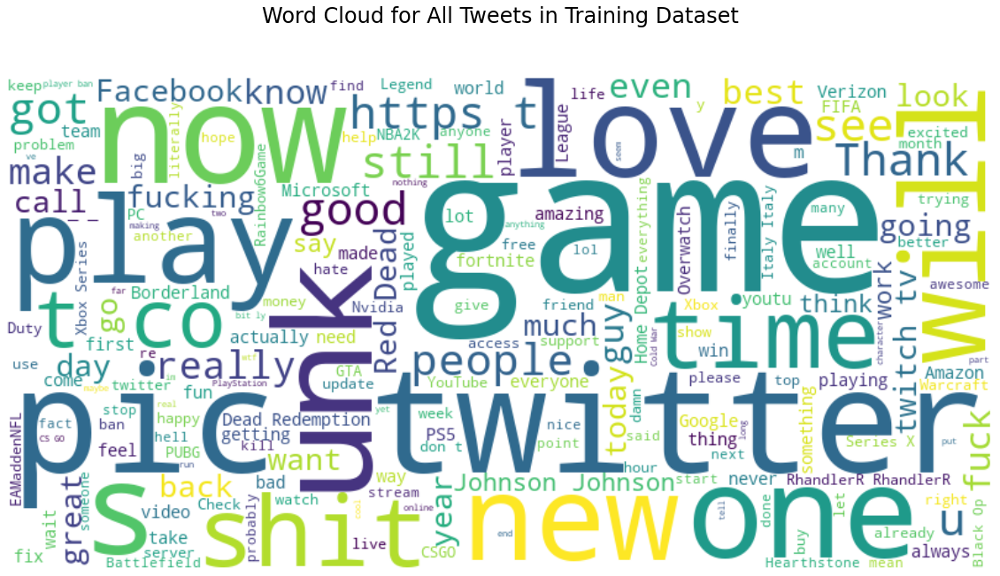

In [12]:
# Concatenate all the tweet contents into a single string
all_content = ' '.join(train_df['Content'].astype(str))

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_content)

# Plot the word cloud
plt.figure(figsize=(20, 20))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for All Tweets in Training Dataset\n\n', fontsize=24)

# Display the word cloud
plt.show()

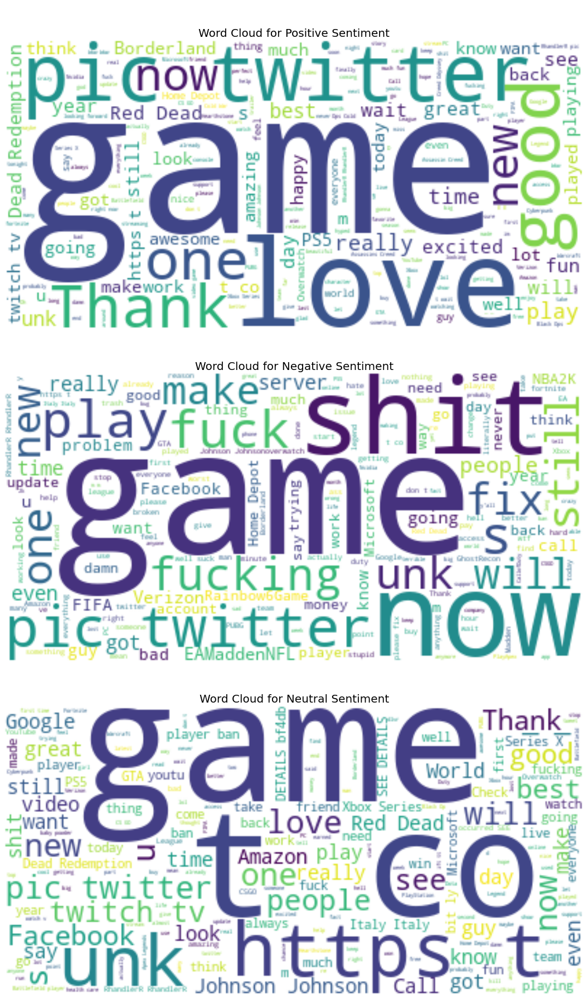

In [13]:
# Generating and plotting word clouds for each sentiment
sentiments = ['Positive', 'Negative', 'Neutral']

# Setting up the plots
fig, axs = plt.subplots(3, 1, figsize=(25, 25))

for sentiment, ax in zip(sentiments, axs.ravel()):
    sentiment_content = " ".join(tweet for tweet in train_df[train_df['Sentiment'] == sentiment]['Content'].astype(str))
    wordcloud_sentiment = WordCloud(background_color='white', width=400, height=200).generate(sentiment_content)
    
    ax.imshow(wordcloud_sentiment, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f'\n\nWord Cloud for {sentiment} Sentiment',fontsize=20)

plt.tight_layout()
plt.show()

### Text Preprocessing using NLTK


In [14]:
#Preprocessing for Removing mentions, URLs, and special characters
def preprocess_text_with_tracking(text):
    original_words = set(re.findall(r'\b\w+\b', text))  # Extract original words before preprocessing
    text = re.sub(r'@[A-Za-z0-9_]+', '', text)  # Remove mentions
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'[^A-Za-z ]+', '', text)  # Remove special characters and numbers
    text = text.lower()  # Convert to lowercase
    preprocessed_words = set(re.findall(r'\b\w+\b', text))  # Extract words after preprocessing
    removed_words = original_words - preprocessed_words  # Calculating removed words
    return text, removed_words


train_df['Content'], removed_words = zip(*train_df['Content'].map(preprocess_text_with_tracking))


for i in range(5):
    print(f"Original: {train_df['Content'].iloc[i]}\nRemoved: {removed_words[i]}\n")

Original: im getting on borderlands and i will murder you all 
Removed: set()

Original: i am coming to the borders and i will kill you all
Removed: {'I'}

Original: im getting on borderlands and i will kill you all
Removed: set()

Original: im coming on borderlands and i will murder you all
Removed: set()

Original: im getting on borderlands  and i will murder you me all
Removed: {'2'}



In [22]:
#Text Lemmatization
lemmatizer = WordNetLemmatizer()

def lemmatize_text(text):
    tokens = nltk.word_tokenize(text)
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(lemmatized_tokens)


train_df['Content'] = train_df['Content'].apply(lemmatize_text)

In [25]:
# Logistic Regression model for sentiment analysis

X_train, X_test, y_train, y_test = train_test_split(train_df['Content'], train_df['Sentiment'], test_size=0.2, random_state=42)

pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', LogisticRegression(max_iter=1000))  # Adjust the value as needed
])

# Training the model
pipeline.fit(X_train, y_train)

# Making predictions on the test set
predictions = pipeline.predict(X_test)

# Evaluating the model accuracy
accuracy = accuracy_score(y_test, predictions)
print(f'Model Accuracy: {accuracy:.2f}')

Model Accuracy: 0.79


### Generating WordCloud for Preprocessed Tweets


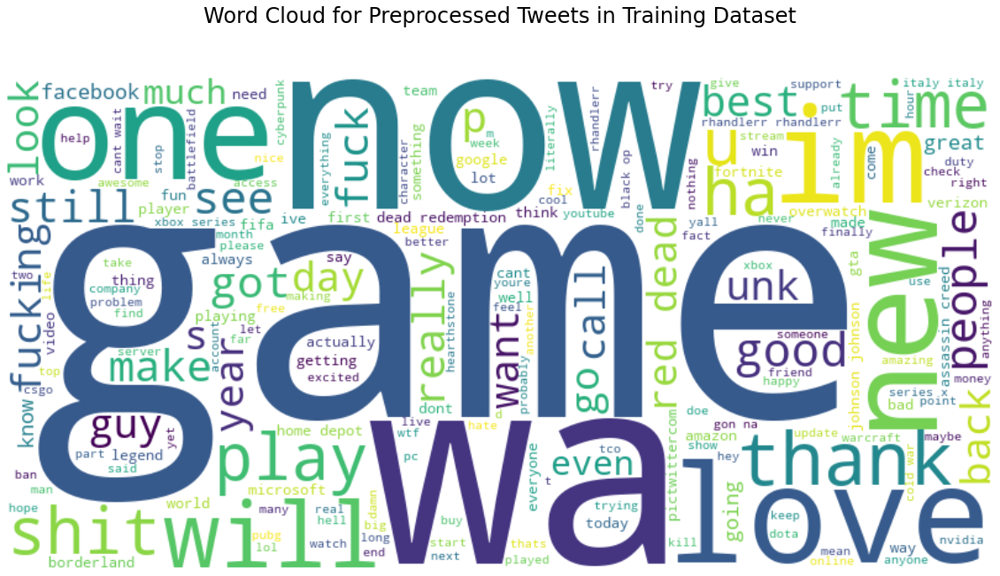

In [26]:
all_content_preprocessed = ' '.join(train_df['Content'].astype(str))

wordcloud_preprocessed = WordCloud(width=800, height=400, background_color='white').generate(all_content_preprocessed)

# Plot the word cloud
plt.figure(figsize=(20, 20))
plt.imshow(wordcloud_preprocessed, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Preprocessed Tweets in Training Dataset\n\n', fontsize=24)
plt.show()